# Brain tumor classification: Trasfer Learning CNN for MRI classification


## Downloading libraries

In [ ]:
%%capture
!pip install tensorflow==2.15.0

In [ ]:
%%capture
!pip install tensorflow-addons

In [ ]:
%%capture
!pip install pydot graphviz

## Importing Libraries

In [ ]:
%%capture
import tensorflow as tf
from tensorflow.keras import Input
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.regularizers import l2
from tensorflow_addons.optimizers import RectifiedAdam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16

from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, TensorBoard, ModelCheckpoint

from sklearn.metrics import accuracy_score, classification_report,confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.svm import SVC

import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


import hashlib
import os
import cv2

from sklearn.utils import shuffle
from tensorflow.keras.utils import plot_model

In [ ]:
print(f'Tensorflow Version: {tf.__version__}')
print("GPU Available:", tf.config.list_physical_devices('GPU')[0])

Tensorflow Version: 2.15.0
GPU Available: PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [ ]:
%%capture
!pip install kaggle

In [ ]:
from google.colab import drive

In [ ]:
! mkdir /content/.kaggle

mkdir: cannot create directory ‘/content/.kaggle’: File exists


In [ ]:
! cp /content/drive/MyDrive/kaggle/kaggle.json /content/.kaggle/

cp: cannot stat '/content/drive/MyDrive/kaggle/kaggle.json': No such file or directory


In [ ]:
! chmod 600 /content/.kaggle/kaggle.json

chmod: cannot access '/content/.kaggle/kaggle.json': No such file or directory


In [ ]:
! kaggle datasets download -d masoudnickparvar/brain-tumor-mri-dataset

Dataset URL: https://www.kaggle.com/datasets/masoudnickparvar/brain-tumor-mri-dataset
License(s): CC0-1.0
brain-tumor-mri-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
%%capture
! unzip /content/brain-tumor-mri-dataset.zip

## Data cleaning

We remove duplicated images in order to remove potential bias due to duplicated image in training and testing dataset

In [ ]:
PROJECT_DIR = '/content/'

LABELS = ['notumor', 'glioma', 'meningioma', 'pituitary']

def compute_hash(file):
    hasher = hashlib.md5()
    with open(file, 'rb') as f:
        buf = f.read()
        hasher.update(buf)
    return hasher.hexdigest()

def list_files(hash_dict):
    for data_type in ['Training', 'Testing']:
        for label in LABELS:
            folder_path = os.path.join(PROJECT_DIR, data_type, label)
            for root, dirs, files in os.walk(folder_path):
                for file in files:
                    if file.endswith(".jpg"):
                        file_path = os.path.join(root, file)
                        file_hash = compute_hash(file_path)
                        if file_hash in hash_dict:
                            hash_dict[file_hash].append(file_path)
                        else:
                            hash_dict[file_hash] = [file_path]

def remove_duplicates(hash_dict):
    duplicate_count = 0
    for hash_value, file_paths in hash_dict.items():
        if len(file_paths) > 1:
            for file_path in file_paths[1:]:  # Keep the first occurrence, remove others

                os.remove(file_path)
                duplicate_count += 1
    print(f"Number of duplicates removed: {duplicate_count}")

if __name__ == '__main__':
    hash_dict = {}
    list_files(hash_dict)
    remove_duplicates(hash_dict)

## Data Manipulation

We import the training and testing image into numpy array after resizing them to 224x224 pixels for transfer learning. We keep the training and testing split given.

In [ ]:
IMAGE_SIZE = 224
BATCH_SIZE = 32
SEED = 42

In [ ]:
labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

In [ ]:
X_train = []
y_train = []


for i in labels:
  folderPath = os.path.join('/content/', 'Training', i)
  for j in os.listdir(folderPath):
      img = cv2.imread(os.path.join(folderPath, j))
      img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE))
      X_train.append(img)
      y_train.append(i)

for i in labels:
  folderPath = os.path.join('/content/', 'Testing', i)
  for j in os.listdir(folderPath):
      img = cv2.imread(os.path.join(folderPath, j))
      img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE))
      X_train.append(img)
      y_train.append(i)

X_train = np.array(X_train)
y_train = np.array(y_train)


The images are in a RGB format

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state= SEED, stratify= y_train)

In [ ]:
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.5, random_state= SEED, stratify = y_test)


## One Hot Encoding on the labels

In [ ]:
y_train_numeric = []
for i in y_train:
    y_train_numeric.append(labels.index(i))
y_train_ohe = tf.keras.utils.to_categorical(y_train_numeric)


y_val_numeric = []
for i in y_val:
    y_val_numeric.append(labels.index(i))
y_val_ohe = tf.keras.utils.to_categorical(y_val_numeric)

y_test_numeric = []
for i in y_test:
    y_test_numeric.append(labels.index(i))
y_test_ohe = tf.keras.utils.to_categorical(y_test_numeric)

## Data Distribution

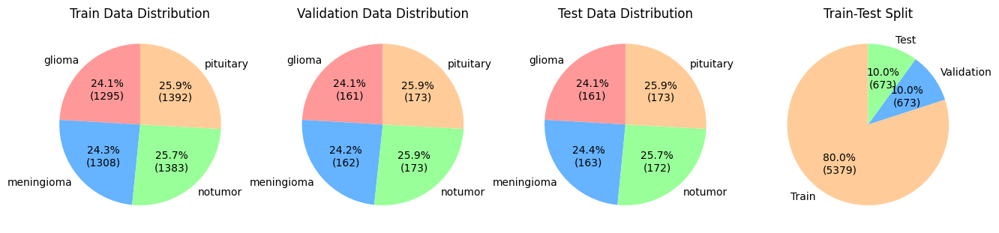

In [ ]:
colors_1 = ['#ff9999','#66b3ff','#99ff99','#ffcc99']
colors_2 = ['#ffcc99','#66b3ff','#99ff99']


unique_train, counts_train = np.unique(y_train, return_counts=True)
unique_val, counts_val = np.unique(y_val, return_counts=True)
unique_test, counts_test = np.unique(y_test, return_counts=True)


fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(16, 6))


ax1.pie(counts_train, labels=unique_train, autopct=lambda pct: f"{pct:.1f}%\n({int(pct/100.*np.sum(counts_train))})", colors = colors_1, startangle = 90)
ax1.set_title('Train Data Distribution')

ax2.pie(counts_val, labels=unique_val, autopct=lambda pct: f"{pct:.1f}%\n({int(pct/100.*np.sum(counts_val))})", colors = colors_1, startangle = 90)
ax2.set_title('Validation Data Distribution')


ax3.pie(counts_test, labels=unique_test, autopct=lambda pct: f"{pct:.1f}%\n({int(pct/100.*np.sum(counts_test))})", colors = colors_1, startangle = 90)
ax3.set_title('Test Data Distribution')



train_size = len(y_train)
val_size = len(y_val)
test_size = len(y_test)
ax4.pie([train_size, val_size, test_size], labels=['Train','Validation' ,'Test'],  autopct=lambda pct: f"{pct:.1f}%\n({int(pct/100.*(train_size + test_size + val_size))})", colors = colors_2, startangle=90)
ax4.set_title('Train-Test Split')

plt.show()


## Data Visualization


In [ ]:
plt.figure(figsize=(12, 12))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.imshow(X_train[i])
    plt.title(y_train[i])
    plt.axis('off')
plt.show()


## Baseline model: Logisitic Regression

In [ ]:
n_train, nx,ny, nrgb = X_train.shape
n_test, nx,ny, nrgb = X_test.shape

print(n_train, nx, ny, nrgb)
print(n_test, nx, ny, nrgb)

X_train_flat = X_train.reshape(n_train, nx*ny*nrgb)
X_test_flat = X_test.reshape(n_test, nx*ny*nrgb)

print(X_train_flat.shape)
print(X_test_flat.shape)

In [ ]:
X_train_base = X_train_flat/255.0
X_test_base = X_test_flat/255.0

In [ ]:
print(y_train)

['meningioma' 'notumor' 'meningioma' ... 'glioma' 'meningioma' 'notumor']


In [ ]:
label_encoder = LabelEncoder()

y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)


In [ ]:
log_reg = LogisticRegression(multi_class= 'multinomial', solver = 'newton-cg', max_iter = 100)
log_reg.fit(X_train_base, y_train_encoded)

In [ ]:
# Previsione sulle immagini di test
y_pred = log_reg.predict(X_test_base)

# Calcola l'accuratezza
accuracy = accuracy_score(y_test_encoded, y_pred)
print(f'Accuratezza: {accuracy:.2f}')

# Stampa un report di classificazione
print(classification_report(y_test_encoded, y_pred))

In [ ]:
cm = confusion_matrix(y_test_encoded, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Confusion Matrix ')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


## Baseline model 2: PCA + SVM (optional)

In [ ]:
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder

In [ ]:
X_train_base = X_train/255.0
X_test_base = X_test/255.0

In [ ]:
n_train, nx,ny, nrgb = X_train.shape
n_test, nx,ny, nrgb = X_test.shape

print(n_train, nx, ny, nrgb)
print(n_test, nx, ny, nrgb)

X_train_flat = X_train_base.reshape(n_train, nx*ny*nrgb)
X_test_flat = X_test_base.reshape(n_test, nx*ny*nrgb)

print(X_train_flat.shape)
print(X_test_flat.shape)

5380 224 224 3
673 224 224 3
(5380, 150528)
(673, 150528)


In [ ]:
print(y_train)

['meningioma' 'notumor' 'meningioma' ... 'glioma' 'meningioma' 'notumor']


In [ ]:
label_encoder = LabelEncoder()


y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

[1 2 1 ... 0 1 2]
[1 1 2 1 2 1 1 3 0 1 1 0 3 3 0 2 1 1 1 0 2 3 1 1 3 2 1 1 0 1 1 3 2 2 2 3 1
 0 1 2 2 1 3 3 3 0 2 2 2 2 0 1 1 1 2 0 3 3 3 0 0 3 3 2 0 0 0 0 3 1 0 1 3 0
 2 2 1 0 0 3 1 1 0 3 1 0 2 0 3 2 3 3 3 2 3 3 0 1 3 3 2 2 3 2 0 2 1 3 3 2 0
 1 2 2 1 1 0 1 1 1 3 2 1 0 1 1 1 2 3 3 3 1 1 2 2 3 0 2 1 3 0 1 3 3 3 0 3 2
 1 3 2 2 2 0 0 0 2 3 0 2 0 2 0 3 1 3 0 2 2 1 3 2 2 3 1 3 0 1 1 3 0 3 1 0 3
 0 2 2 2 1 3 3 0 1 1 0 2 3 2 2 0 2 2 2 0 3 2 3 2 1 1 1 2 3 3 3 0 3 3 3 2 2
 3 1 3 1 0 0 1 0 0 1 2 1 2 1 0 3 0 3 3 0 0 0 2 0 1 3 1 2 0 0 3 3 0 0 1 1 1
 0 2 1 3 0 1 0 3 0 2 0 3 2 2 3 2 2 0 3 1 1 2 1 2 0 3 2 0 0 0 0 3 0 2 1 0 0
 0 2 2 3 1 0 2 1 3 0 2 3 0 2 2 0 0 0 1 3 3 0 3 1 3 3 0 2 0 2 2 1 2 1 1 0 2
 0 1 2 1 0 1 2 3 2 2 3 2 2 3 0 3 3 1 0 1 2 2 0 1 0 3 2 0 2 1 3 3 2 1 1 1 2
 0 0 2 1 3 3 2 3 1 0 3 1 2 2 3 0 2 0 3 0 3 3 0 0 3 2 1 2 3 3 0 2 3 0 0 0 2
 0 0 3 3 3 2 1 3 1 1 1 1 2 1 1 1 3 0 1 3 2 3 2 2 2 1 1 3 1 2 2 1 1 3 1 3 0
 2 3 3 2 0 3 1 1 2 3 2 2 2 3 2 0 1 0 3 0 0 3 3 1 0 0 1 1 2 0 2 3 0 2 3 3 2
 3 0 0 

Text(0, 0.5, 'cumulative explained variance')

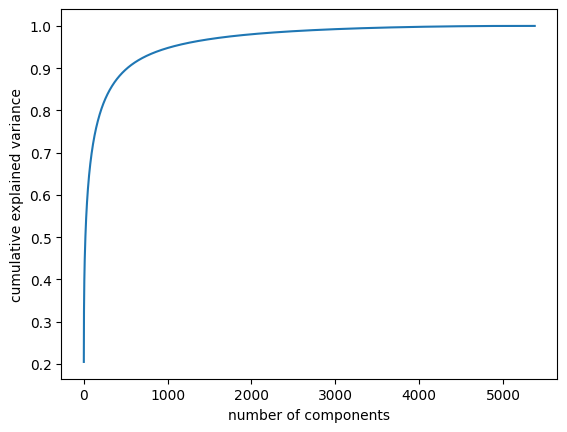

In [ ]:
pca = PCA().fit(X_train_flat)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

In [ ]:
import numpy as np
# Find the number of components needed to explain 95% of the variance
n_components = np.argmax(np.cumsum(pca.explained_variance_ratio_) > 0.95) + 1
print(f"Number of components for 0.95 explained variance: {n_components}")


Number of components for 0.95 explained variance: 1040


The number of components which correspond to 0.95 expained variance is 1096

In [ ]:
pca = PCA(n_components=n_components)
X_train_pca = pca.fit_transform(X_train_flat)
X_test_pca = pca.transform(X_test_flat)

In [ ]:
print(X_train_pca.shape)
print(X_test_pca.shape)

(5380, 1040)
(673, 1040)


In [ ]:
svm = SVC(kernel='linear')
svm.fit(X_train_pca, y_train_encoded)

SVC(kernel='linear')

In [ ]:
y_pred = svm.predict(X_test_pca)

In [ ]:
accuracy = accuracy_score(y_test_encoded, y_pred)
print(f"Accuracy: {accuracy}")

Accuracy: 0.861812778603269


In [ ]:
print(classification_report(y_test_encoded,y_pred))

              precision    recall  f1-score   support

           0       0.84      0.73      0.78       162
           1       0.72      0.79      0.75       164
           2       0.95      0.95      0.95       173
           3       0.94      0.97      0.95       174

    accuracy                           0.86       673
   macro avg       0.86      0.86      0.86       673
weighted avg       0.86      0.86      0.86       673



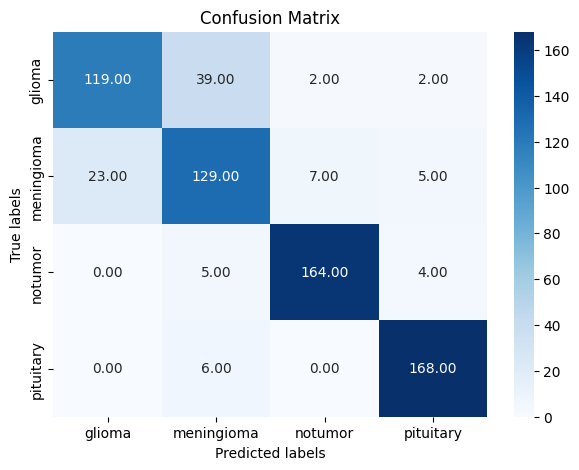

In [ ]:
cm = confusion_matrix(y_test_encoded, y_pred)
plt.figure(figsize=(7, 5))
sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
svm_direct = SVC(kernel='linear')
svm_direct.fit(X_train_flat, y_train_encoded)

KeyboardInterrupt: 

In [ ]:
y_pred_direct = svm_direct.predict(X_test_flat)

In [ ]:
accuracy_direct = accuracy_score(y_test_encoded, y_pred_direct)
print(f"Accuracy: {accuracy_direct}")

## Loading DataGenerator

Loding the data in tf.data.Dataset format

In [ ]:
train_datagen_flat = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)


train_generator_flat = train_datagen_flat.flow(X_train,
                                          y_train_ohe,
                                          batch_size= BATCH_SIZE,
                                          seed= SEED)

val_generator = val_datagen.flow(X_val,
                                          y_val_ohe,
                                          batch_size= BATCH_SIZE,
                                          shuffle = False,
                                          seed= SEED)

test_generator = test_datagen.flow(X_test,
                                          y_test_ohe,
                                          batch_size= BATCH_SIZE,
                                          shuffle=False,
                                          seed= SEED)

In [ ]:
test_generator.reset()
y_test_gen = []
for i in range(len(test_generator)):
  _, labels = next(test_generator)
  y_test_gen.extend(np.argmax(labels, axis=1))

### Visualizing the first batch

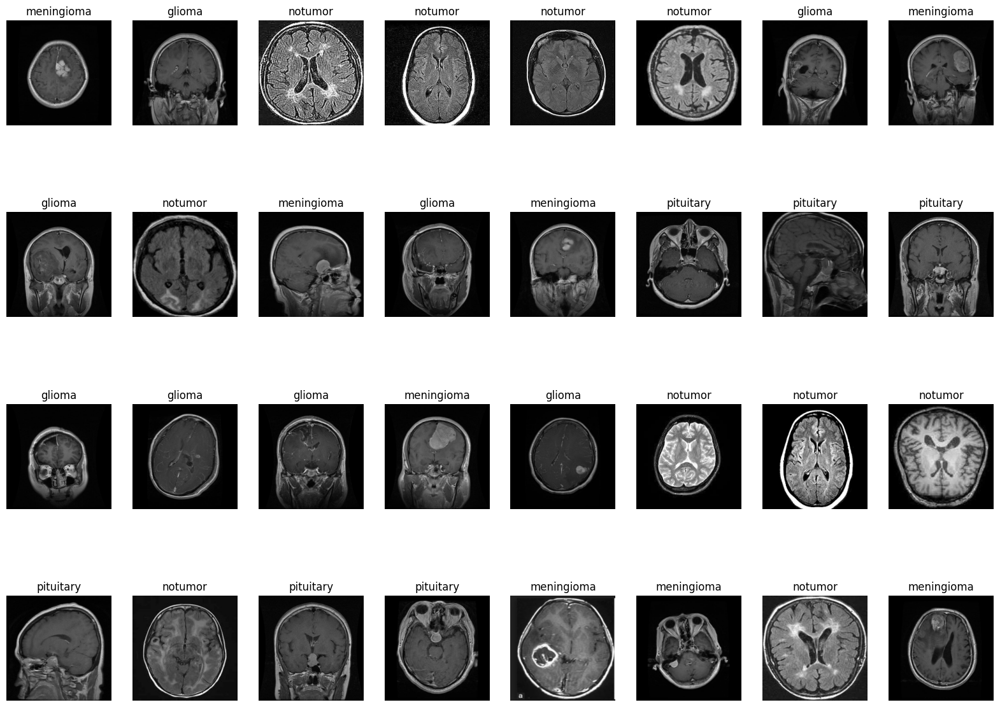

In [ ]:
labels = ['glioma', 'meningioma', 'notumor', 'pituitary']
images, label = next(train_generator_flat)
plt.figure(figsize=(20, 15))
for i in range(32):
    ax = plt.subplot(4, 8, i + 1)
    plt.imshow(images[i])
    plt.title(labels[np.argmax(label[i])])
    plt.axis("off")

## 3-layers-CNN

### Building the model

In [ ]:
cnn = Sequential(name="CNN")

cnn.add(Conv2D(32, (3, 3), activation='relu', input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)))
cnn.add(MaxPooling2D((2, 2)))

cnn.add(Conv2D(64, (3, 3), activation='relu'))
cnn.add(MaxPooling2D((2, 2)))

cnn.add(Conv2D(128, (3, 3), activation='relu', name = "cnn_last_conv_layer"))
cnn.add(MaxPooling2D((2, 2)))

cnn.add(Flatten())
cnn.add(Dense(128, activation='relu'))
cnn.add(Dense(4))
cnn.add(Activation('softmax'))


cnn.summary()

Model: "CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 111, 111, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_3 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 cnn_last_conv_layer (Conv2  (None, 52, 52, 128)       73856     
 D)                                                              
                                                               

### Training

In [ ]:
cnn_loss = tf.keras.losses.CategoricalCrossentropy()
cnn_optimizer = RectifiedAdam(learning_rate=0.0001, beta_1 = 0.9, beta_2 = 0.999, epsilon = 1e-08)

In [ ]:
cnn.compile(optimizer=cnn_optimizer, loss=cnn_loss, metrics=['accuracy'])

In [ ]:
cnn_tensorboard = TensorBoard(log_dir = 'logs')
cnn_checkpoint = ModelCheckpoint("CNN.h5",monitor="val_accuracy",save_best_only=True,mode="auto",verbose=1)
cnn_earlystopping = EarlyStopping(monitor="val_accuracy",mode="auto",patience=5)
cnn_reduce_lr = ReduceLROnPlateau(monitor = 'val_accuracy', factor = 0.3, patience = 2, min_delta = 0.001,
                              mode='auto',verbose=1)

In [ ]:
cnn_history = cnn.fit(train_generator_flat, validation_data = val_generator, epochs =20, verbose=1,
                   callbacks=[cnn_tensorboard,cnn_checkpoint,cnn_reduce_lr, cnn_earlystopping])

Epoch 1/20
168/169 [============================>.] - ETA: 0s - loss: 0.9974 - accuracy: 0.5795
Epoch 1: val_accuracy improved from -inf to 0.71025, saving model to CNN.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


169/169 [==============================] - 15s 59ms/step - loss: 0.9964 - accuracy: 0.5799 - val_loss: 0.7328 - val_accuracy: 0.7103 - lr: 1.0000e-04
Epoch 2/20
169/169 [==============================] - ETA: 0s - loss: 0.5894 - accuracy: 0.7801
Epoch 2: val_accuracy improved from 0.71025 to 0.81724, saving model to CNN.h5
169/169 [==============================] - 9s 54ms/step - loss: 0.5894 - accuracy: 0.7801 - val_loss: 0.5193 - val_accuracy: 0.8172 - lr: 1.0000e-04
Epoch 3/20
169/169 [==============================] - ETA: 0s - loss: 0.4469 - accuracy: 0.8379
Epoch 3: val_accuracy improved from 0.81724 to 0.83804, saving model to CNN.h5
169/169 [==============================] - 9s 54ms/step - loss: 0.4469 - accuracy: 0.8379 - val_loss: 0.4500 - val_accuracy: 0.8380 - lr: 1.0000e-04
Epoch 4/20
168/169 [============================>.] - ETA: 0s - loss: 0.3464 - accuracy: 0.8727
Epoch 4: val_accuracy did not improve from 0.83804
169/169 [==============================] - 9s 52ms/step

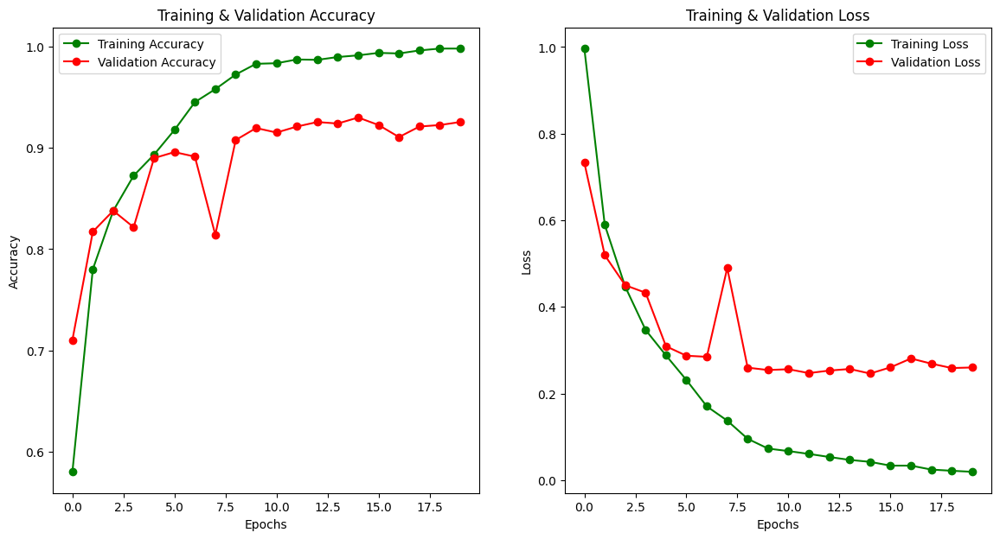

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(14,7))
train_acc = cnn_history.history['accuracy']
train_loss = cnn_history.history['loss']
val_acc = cnn_history.history['val_accuracy']
val_loss = cnn_history.history['val_loss']

epochs = [i for i in range(len(train_loss))]

ax[0].plot(epochs,train_acc,'go-',label='Training Accuracy')
ax[0].plot(epochs,val_acc,'ro-',label='Validation Accuracy')
ax[0].set_title('Training & Validation Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs,train_loss,'go-',label='Training Loss')
ax[1].plot(epochs,val_loss,'ro-',label='Validation Loss')
ax[1].set_title('Training & Validation Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")
plt.show()

### Prediction


In [ ]:
cnn_pred = cnn.predict(test_generator, steps = len(test_generator))
cnn_pred = np.argmax(cnn_pred,axis=1)

22/22 [==============================] - 1s 19ms/step


### Classification Report and confusion matrix

In [ ]:
print(classification_report(y_test_gen,cnn_pred))

              precision    recall  f1-score   support

           0       0.90      0.95      0.92       162
           1       0.92      0.86      0.89       164
           2       0.98      0.96      0.97       173
           3       0.96      0.98      0.97       174

    accuracy                           0.94       673
   macro avg       0.94      0.94      0.94       673
weighted avg       0.94      0.94      0.94       673



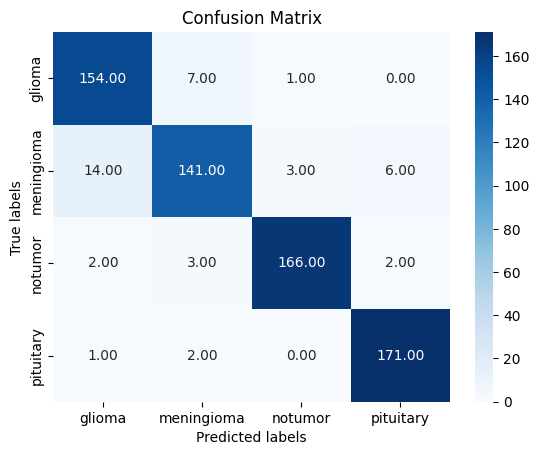

In [ ]:
labels = ['glioma', 'meningioma', 'notumor', 'pituitary']
cm = confusion_matrix(y_test_gen, cnn_pred)
sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()


### Misclassified points

In [ ]:
def misclassified_points(pred):

    labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

    # Initialize empty lists to store images, true labels, and predictions
    all_images = []
    all_true_labels = []

    # Reset the generator to start from the first batch
    test_generator.reset()

    # Loop over the entire test set
    for i in range(len(test_generator)):
        # Get a batch of images and their true labels
        images, true_labels = test_generator.next()

        # Predict the labels for the current batch

        # Append to the lists
        all_images.extend(images)
        all_true_labels.extend(np.argmax(true_labels, axis=1))  # Convert one-hot to class indices

    # Convert lists to arrays
    all_images = np.array(all_images)
    all_true_labels = np.array(all_true_labels)
    all_predictions = np.array(pred)

    # Find the indices of misclassified images
    misclassified_indices = np.where(all_true_labels != pred)[0]

    # Print the number of misclassified images (optional)
    print(f"Number of misclassified images: {len(misclassified_indices)}")

    # Plot the misclassified images
    plt.figure(figsize=(20, 15))
    for i, mis_idx in enumerate(misclassified_indices):
        ax = plt.subplot(6, 7, i + 1)  # Adjust the grid size based on how many images you want to show
        plt.imshow(all_images[mis_idx])

        # Set the title to show both the true label and the predicted label
        true_label = labels[all_true_labels[mis_idx]]
        predicted_label = labels[pred[mis_idx]]
        plt.title(f"True: {true_label}\nPred: {predicted_label}")
        plt.axis("off")

        # Break if too many misclassified images (adjust as necessary)
        if i == 36:  # Display up to 42 images (6x7 grid)
            break

    plt.tight_layout()
    plt.show()


In [ ]:
misclassified_points(cnn_pred)

Number of misclassified images: 41


### Salicency Map

In [ ]:
def get_saliency_map(model, image, label):
    """
    Generates a saliency map for a given image and label.

    Args:
        model: The Keras model.
        image: The input image.
        label: The true label of the image.

    Returns:
        A saliency map.
    """
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    with tf.GradientTape() as tape:
        inputs = tf.cast(image, tf.float32)
        tape.watch(inputs)
        predictions = model(inputs)
        loss = predictions[:, label]  # Focus on the specific label

    # Get the gradients of the loss with respect to the input image
    grads = tape.gradient(loss, inputs)

    # Take the absolute value of the gradients
    saliency_map = tf.math.abs(grads[0])

    # Average across color channels
    saliency_map = np.mean(saliency_map, axis=-1)

    return saliency_map

In [ ]:
def remove_last_layer_activation(model):
    # Remove the last layer (softmax) from the model
    return tf.keras.models.Model(inputs=model.input, outputs=model.layers[-2].output)

In [ ]:
def display_silency_map(image_indices, model):
      linear_model = remove_last_layer_activation(model)

      # Fetch images and labels from the test generator
      test_generator.reset()  # Reset the generator to ensure consistence

      # Visualize saliency maps
      plt.figure(figsize=(15, 5))

      for i, idx in enumerate(image_indices):
          # Retrieve the image and label batch-wise
          batch_index = idx // test_generator.batch_size  # Batch number
          image_index_in_batch = idx % test_generator.batch_size  # Index within the batch

          # Retrieve the batch (in a way similar to iterating over the test generator)
          test_generator.reset()  # Ensure the generator starts from the beginning
          for _ in range(batch_index + 1):
              images, true_labels = next(test_generator)

          # Select the specific image and label from the batch
          image = images[image_index_in_batch]
          true_label = np.argmax(true_labels[image_index_in_batch])

          # Get model predictions
          pred = model.predict(np.expand_dims(image, axis=0))  # Predict on a single image
          predicted_label = np.argmax(pred)

          # Generate the saliency map for the image
          saliency_map = get_saliency_map(linear_model, image, true_label)

          # Plot the image and overlay the saliency map
          plt.subplot(1, 4, i + 1)
          plt.imshow(image)
          plt.imshow(saliency_map, cmap='jet', alpha=0.5)  # Overlay saliency map
          plt.title(f"True: {labels[true_label]}, Predicted: {labels[predicted_label]}")
          plt.axis('off')
          plt.colorbar(fraction=0.046, pad=0.04)  # Color map legend for the saliency map

      # Show all visualizations
      plt.tight_layout()
      plt.show()

In [ ]:
display_silency_map([170, 464, 27, 2], cnn)

### GradCAM


In [ ]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions

    grad_model = tf.keras.models.Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])  # Choose the predicted class if none is provided
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiply each channel by "how important this channel is" with regard to the top predicted class
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Normalize the heatmap between 0 and 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [ ]:
def display_gradcam(img_indices, model, last_conv_layer_name, alpha=0.002):
    # Remove softmax layer from the model
    model_no_softmax = remove_last_layer_activation(model)

    test_generator.reset()

    plt.figure(figsize=(15, 5))
    for i, idx in enumerate(img_indices):
        # Retrieve the image and label batch-wise
        batch_index = idx // test_generator.batch_size  # Batch number
        image_index_in_batch = idx % test_generator.batch_size  # Index within the batch

        # Reset generator and fetch the relevant batch
        test_generator.reset()
        for _ in range(batch_index + 1):
            images, true_labels = next(test_generator)

        # Select the specific image and label from the batch
        image = images[image_index_in_batch]
        true_label = np.argmax(true_labels[image_index_in_batch])

        # Get model predictions
        pred = model_no_softmax.predict(np.expand_dims(image, axis=0))  # Predict on a single image
        predicted_label = np.argmax(pred)

        # Generate Grad-CAM heatmap
        image_expanded = np.expand_dims(image, axis=0)
        heatmap = make_gradcam_heatmap(image_expanded, model_no_softmax, last_conv_layer_name)

        # Rescale heatmap to a range 0-255
        heatmap = np.uint8(255 * heatmap)

        # Use jet colormap to colorize heatmap
        jet = mpl.colormaps["jet"]
        jet_colors = jet(np.arange(256))[:, :3]
        jet_heatmap = jet_colors[heatmap]

        # Create an image with RGB colorized heatmap
        jet_heatmap = tf.keras.utils.array_to_img(jet_heatmap)
        jet_heatmap = jet_heatmap.resize((image.shape[1], image.shape[0]))
        jet_heatmap = tf.keras.utils.img_to_array(jet_heatmap)

        # Superimpose the heatmap on original image
        superimposed_img = jet_heatmap * alpha + image
        #superimposed_img = np.squeeze(superimposed_img, axis=0)
        superimposed_img = tf.keras.utils.array_to_img(superimposed_img)

        # Plot the image and overlay the saliency map
        plt.subplot(1, 4, i + 1)
        plt.imshow(superimposed_img)
        plt.title(f"True: {labels[true_label]}, Predicted: {labels[predicted_label]}")
        plt.axis('off')
        plt.colorbar(fraction=0.046, pad=0.04)  # Color map legend for the saliency map

    plt.tight_layout()
    plt.show()

1/1 [==============================] - 0s 19ms/step


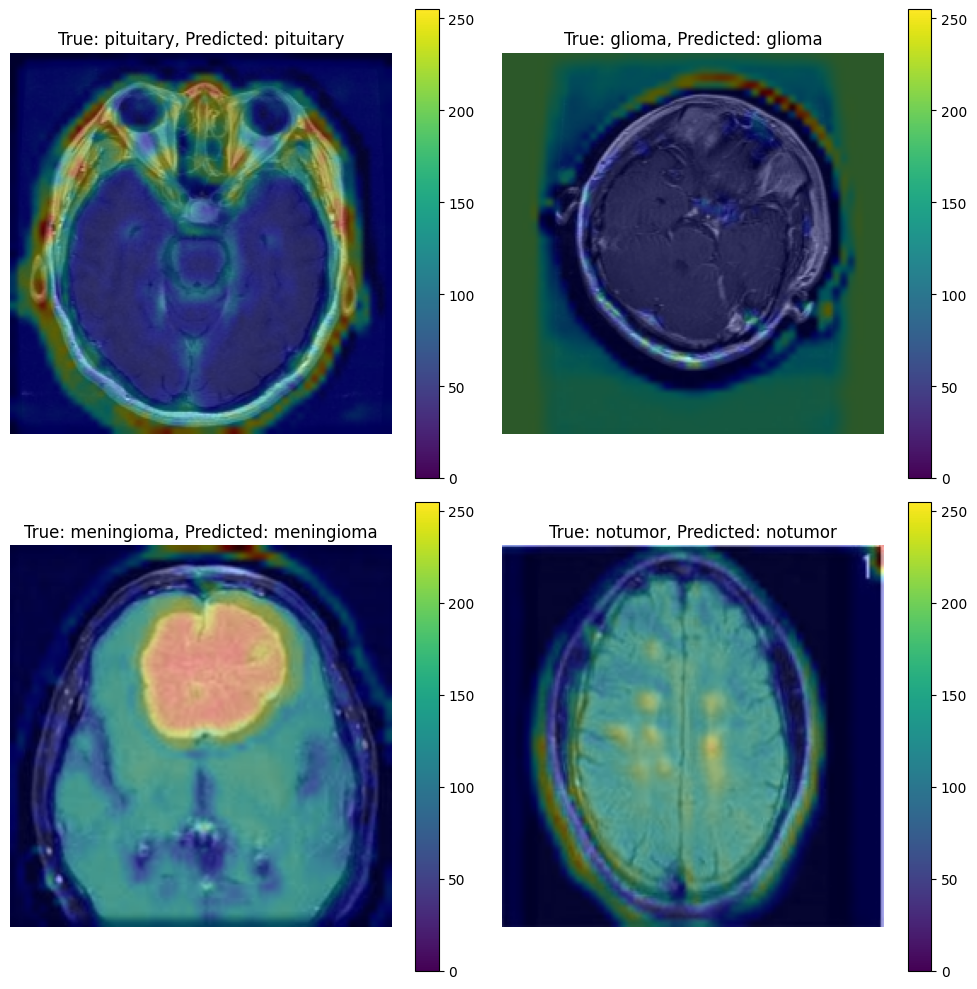

In [ ]:
display_gradcam([170, 464, 27, 2], cnn, 'cnn_last_conv_layer')

## 3-layer-CNN-regularized


### Builing the model

In [ ]:
cnn_reg = Sequential(name="CNN_REG")

regularization_factor = 0.001

cnn_reg.add(Conv2D(32, (3, 3), activation='relu', input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3),
            kernel_regularizer=l2(regularization_factor)))
cnn_reg.add(MaxPooling2D((2, 2)))


cnn_reg.add(Conv2D(64, (3, 3), activation='relu',
            kernel_regularizer=l2(regularization_factor)))
cnn_reg.add(MaxPooling2D((2, 2)))


cnn_reg.add(Conv2D(128, (3, 3), activation='relu',
                   kernel_regularizer=l2(regularization_factor),
                  name = 'cnn_reg_last_conv_layer'))
cnn_reg.add(MaxPooling2D((2, 2)))


cnn_reg.add(Flatten())
cnn_reg.add(Dense(128, activation='relu',kernel_regularizer=l2(regularization_factor)))
cnn_reg.add(Dense(4))
cnn_reg.add(Activation('softmax'))

cnn_reg.summary()

Model: "CNN_REG"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 cnn_reg_last_conv_layer (C  (None, 52, 52, 128)       73856     
 onv2D)                                                          
                                                           

### Training

In [ ]:
cnn_reg_loss = tf.keras.losses.CategoricalCrossentropy()
cnn_reg_optimizer = RectifiedAdam(learning_rate=0.0001, beta_1 = 0.9, beta_2 = 0.999, epsilon = 1e-08)

In [ ]:
cnn_reg.compile(optimizer=cnn_reg_optimizer, loss= cnn_reg_loss, metrics=['accuracy'])

In [ ]:
cnn_reg_tensorboard = TensorBoard(log_dir = 'logs')
cnn_reg_checkpoint = ModelCheckpoint("CNN_REG.h5",monitor="val_accuracy",save_best_only=True,mode="auto",verbose=1)
cnn_reg_earlystopping = EarlyStopping(monitor="val_accuracy",mode="auto",patience=5)
cnn_reg_reduce_lr = ReduceLROnPlateau(monitor = 'val_accuracy', factor = 0.3, patience = 2, min_delta = 0.001,
                              mode='auto',verbose=1)

In [ ]:
cnn_reg_history = cnn_reg.fit(train_generator_flat, validation_data = val_generator, epochs =27, verbose=1,
                   callbacks=[cnn_reg_tensorboard,cnn_reg_checkpoint,cnn_reg_reduce_lr, cnn_reg_earlystopping])

Epoch 1/27
169/169 [==============================] - ETA: 0s - loss: 1.3875 - accuracy: 0.5572
Epoch 1: val_accuracy improved from -inf to 0.71917, saving model to CNN_REG.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


169/169 [==============================] - 18s 69ms/step - loss: 1.3875 - accuracy: 0.5572 - val_loss: 1.0939 - val_accuracy: 0.7192 - lr: 1.0000e-04
Epoch 2/27
169/169 [==============================] - ETA: 0s - loss: 0.9398 - accuracy: 0.7574
Epoch 2: val_accuracy improved from 0.71917 to 0.79346, saving model to CNN_REG.h5
169/169 [==============================] - 11s 63ms/step - loss: 0.9398 - accuracy: 0.7574 - val_loss: 0.8529 - val_accuracy: 0.7935 - lr: 1.0000e-04
Epoch 3/27
169/169 [==============================] - ETA: 0s - loss: 0.7615 - accuracy: 0.8279
Epoch 3: val_accuracy improved from 0.79346 to 0.84993, saving model to CNN_REG.h5
169/169 [==============================] - 11s 66ms/step - loss: 0.7615 - accuracy: 0.8279 - val_loss: 0.7196 - val_accuracy: 0.8499 - lr: 1.0000e-04
Epoch 4/27
169/169 [==============================] - ETA: 0s - loss: 0.6667 - accuracy: 0.8636
Epoch 4: val_accuracy improved from 0.84993 to 0.87816, saving model to CNN_REG.h5
169/169 [====

KeyboardInterrupt: 

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(14,7))
train_acc = cnn_reg_history.history['accuracy']
train_loss = cnn_reg_history.history['loss']
val_acc = cnn_reg_history.history['val_accuracy']
val_loss = cnn_reg_history.history['val_loss']

epochs = [i for i in range(len(train_loss))]

ax[0].plot(epochs,train_acc,'go-',label='Training Accuracy')
ax[0].plot(epochs,val_acc,'ro-',label='Validation Accuracy')
ax[0].set_title('Training & Validation Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs,train_loss,'go-',label='Training Loss')
ax[1].plot(epochs,val_loss,'ro-',label='Validation Loss')
ax[1].set_title('Training & Validation Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")
plt.show()

### Prediction


In [ ]:
cnn_reg_pred = cnn_reg.predict(test_generator, steps = len(test_generator))
cnn_reg_pred = np.argmax(cnn_reg_pred,axis=1)

### Classification Report and confusion matrix

In [ ]:
print(classification_report(y_test_gen,cnn_reg_pred))

In [ ]:
labels = ['glioma', 'meningioma', 'notumor', 'pituitary']
cm = confusion_matrix(y_test_gen, cnn_reg_pred)
sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()


### Misclassified points

Number of misclassified images: 38


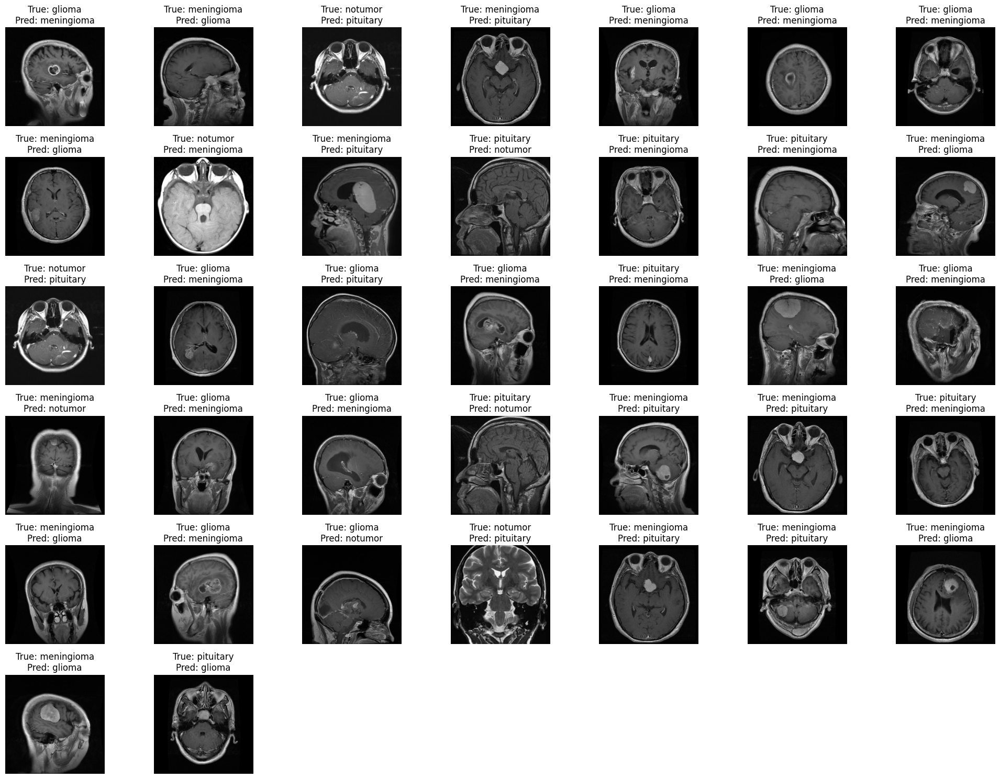

In [ ]:
misclassified_points(cnn_reg_pred)

### Salency map

1/1 [==============================] - 0s 20ms/step


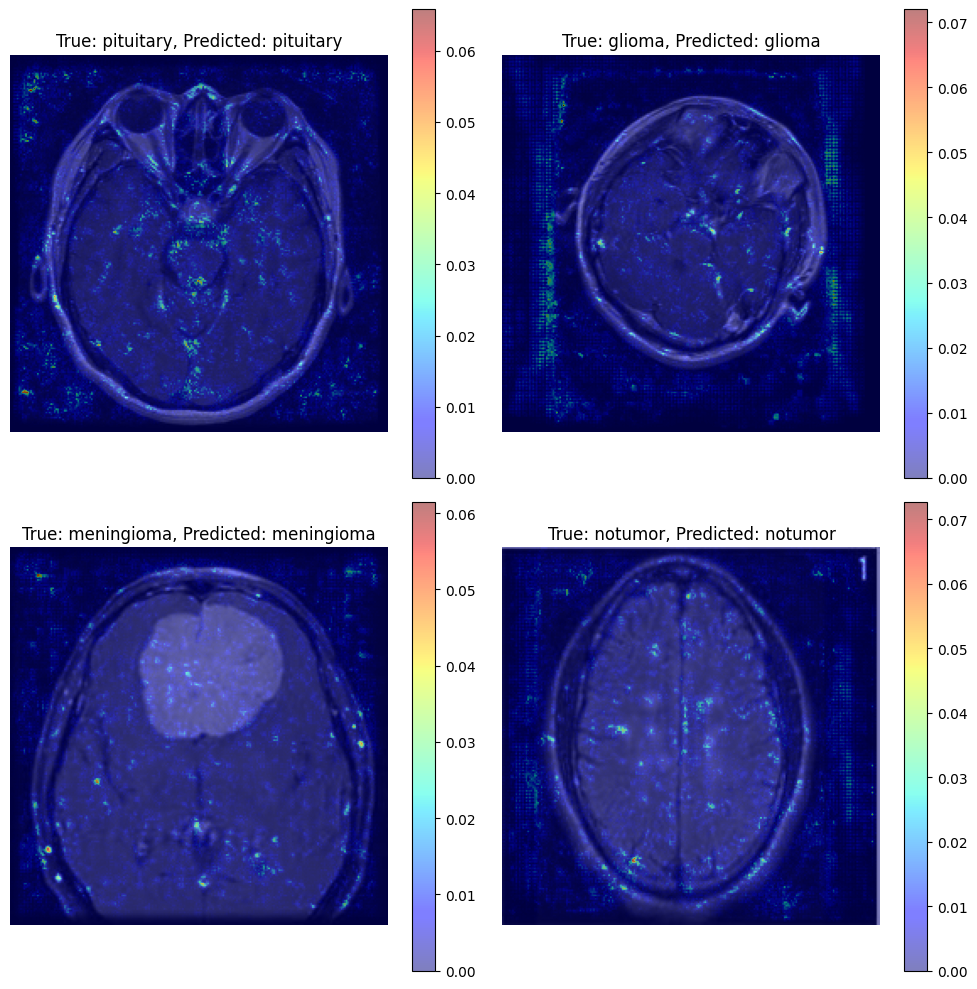

In [ ]:
display_silency_map([7, 8, 0, 2], cnn_reg)

### GradCAM


1/1 [==============================] - 0s 18ms/step


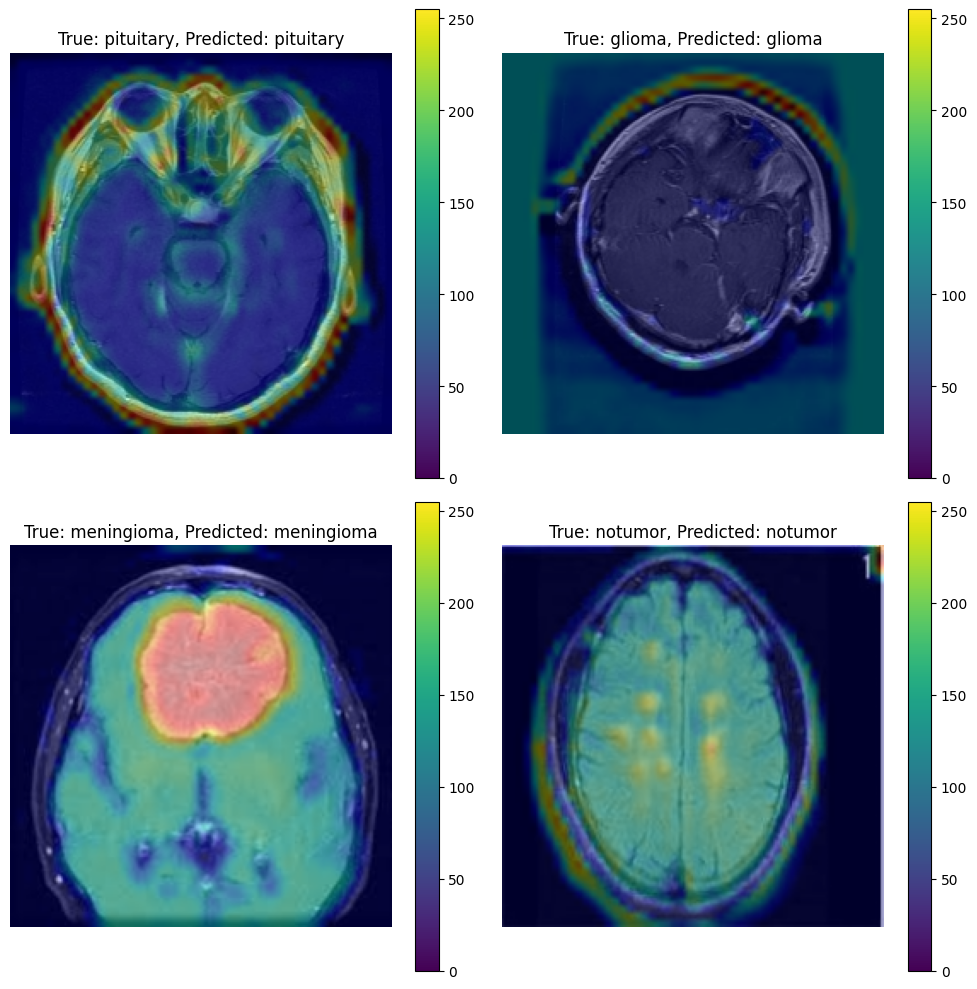

In [ ]:
display_gradcam([7, 8, 0, 2], cnn_reg, 'cnn_reg_last_conv_layer')

## VGG16

### Building the model

In [ ]:
vgg16flat_model = VGG16(weights='imagenet', include_top= False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
for layer in vgg16flat_model.layers:
 layer.trainable = False

vgg16flat_model.layers[-2].trainable = True
vgg16flat_model.layers[-3].trainable = True
vgg16flat_model.layers[-4].trainable = True

x = GlobalAveragePooling2D()(vgg16flat_model.output)
x = Dropout(0.05)(x)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.1))(x)
x = Dense(4)(x)
x = Activation('softmax')(x)

vgg16flat = Model(inputs = vgg16flat_model.input, outputs = x, name = "VGG16_flat")
vgg16flat.summary()

last_conv_layer_name = 'block5_conv3'

### Training

In [ ]:
vgg16flat_loss = tf.keras.losses.CategoricalCrossentropy()
vgg16flat_optimizer = RectifiedAdam(learning_rate=0.0001, beta_1 = 0.9, beta_2 = 0.999, epsilon = 1e-08)

In [ ]:
vgg16flat.compile(optimizer=vgg16flat_optimizer, loss=vgg16flat_loss, metrics=['accuracy'])

In [ ]:
vgg16flat_tensorboard = TensorBoard(log_dir = 'logs')
vgg16flat_checkpoint = ModelCheckpoint("vgg16_flat.h5",monitor="val_accuracy",save_best_only=True,mode="auto",verbose=1)
vgg16flat_earlystopping = EarlyStopping(monitor="val_accuracy",mode="auto",patience=5)
vgg16flat_reduce_lr = ReduceLROnPlateau(monitor = 'val_accuracy', factor = 0.3, patience = 2, min_delta = 0.001,
                              mode='auto',verbose=1)

In [ ]:
vgg_16flat_history = vgg16flat.fit(train_generator_flat, validation_data = val_generator, epochs =14, verbose=1, batch_size= BATCH_SIZE,
                   callbacks=[vgg16flat_tensorboard,vgg16flat_checkpoint,vgg16flat_reduce_lr, vgg16flat_earlystopping])

Epoch 1/14
169/169 [==============================] - ETA: 0s - loss: 20.7479 - accuracy: 0.6855
Epoch 1: val_accuracy improved from -inf to 0.86181, saving model to vgg16_flat.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


169/169 [==============================] - 32s 181ms/step - loss: 20.7479 - accuracy: 0.6855 - val_loss: 19.2414 - val_accuracy: 0.8618 - lr: 1.0000e-04
Epoch 2/14
169/169 [==============================] - ETA: 0s - loss: 17.8411 - accuracy: 0.8838
Epoch 2: val_accuracy improved from 0.86181 to 0.89896, saving model to vgg16_flat.h5
169/169 [==============================] - 30s 180ms/step - loss: 17.8411 - accuracy: 0.8838 - val_loss: 16.3195 - val_accuracy: 0.8990 - lr: 1.0000e-04
Epoch 3/14
169/169 [==============================] - ETA: 0s - loss: 14.7650 - accuracy: 0.9169
Epoch 3: val_accuracy improved from 0.89896 to 0.90788, saving model to vgg16_flat.h5
169/169 [==============================] - 30s 176ms/step - loss: 14.7650 - accuracy: 0.9169 - val_loss: 13.2599 - val_accuracy: 0.9079 - lr: 1.0000e-04
Epoch 4/14
169/169 [==============================] - ETA: 0s - loss: 11.7501 - accuracy: 0.9346
Epoch 4: val_accuracy improved from 0.90788 to 0.92422, saving model to vgg16_

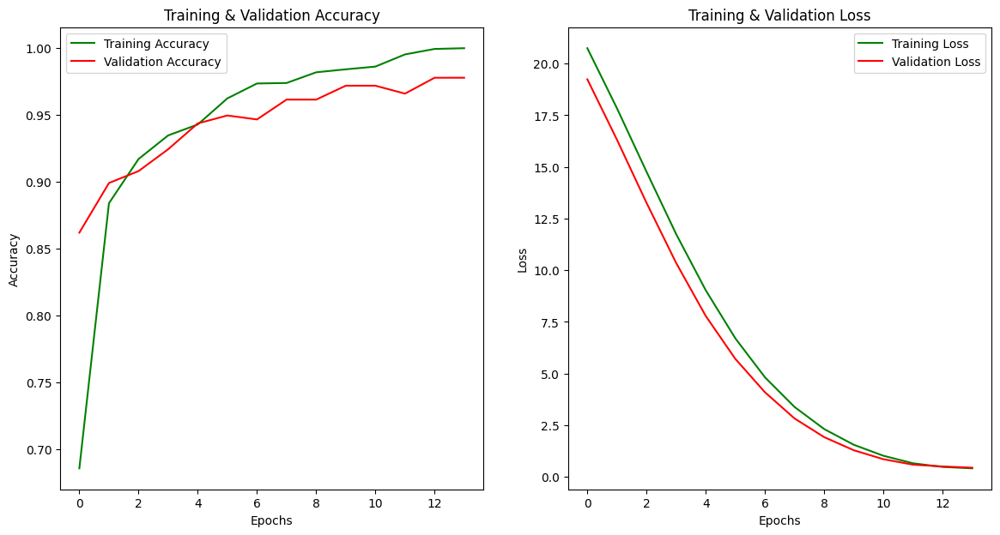

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(14,7))
train_acc = vgg_16flat_history.history['accuracy']
train_loss = vgg_16flat_history.history['loss']
val_acc = vgg_16flat_history.history['val_accuracy']
val_loss = vgg_16flat_history.history['val_loss']

epochs = [i for i in range(len(train_loss))]

ax[0].plot(epochs,train_acc,'g-',label='Training Accuracy')
ax[0].plot(epochs,val_acc,'r-',label='Validation Accuracy')
ax[0].set_title('Training & Validation Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs,train_loss,'g-',label='Training Loss')
ax[1].plot(epochs,val_loss,'r-',label='Validation Loss')
ax[1].set_title('Training & Validation Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")
plt.show()

### Prediction

In [ ]:
vgg16flat_pred = vgg16flat.predict(test_generator, steps = len(test_generator))
vgg16flat_pred = np.argmax(vgg16flat_pred,axis=1)

22/22 [==============================] - 3s 135ms/step


### Classification Report and confusion matrix

In [ ]:
print(classification_report(y_test_gen,vgg16flat_pred))

              precision    recall  f1-score   support

           0       0.97      0.98      0.97       162
           1       0.93      0.93      0.93       164
           2       0.99      0.97      0.98       173
           3       0.97      0.97      0.97       174

    accuracy                           0.96       673
   macro avg       0.96      0.96      0.96       673
weighted avg       0.96      0.96      0.96       673



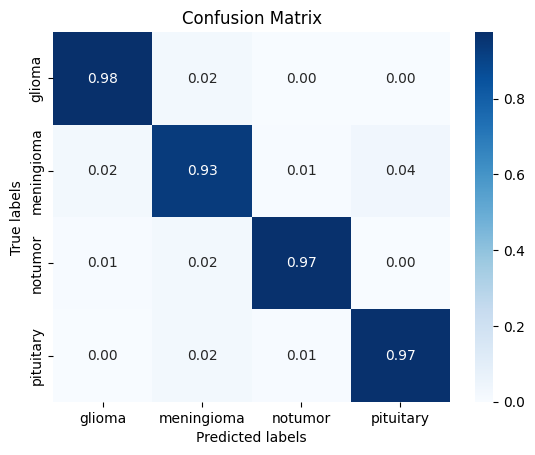

In [ ]:
labels = ['glioma', 'meningioma', 'notumor', 'pituitary']
cm = confusion_matrix(y_test_gen, vgg16flat_pred, normalize ="true")
sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()


### Misclassified points

Number of misclassified images: 25


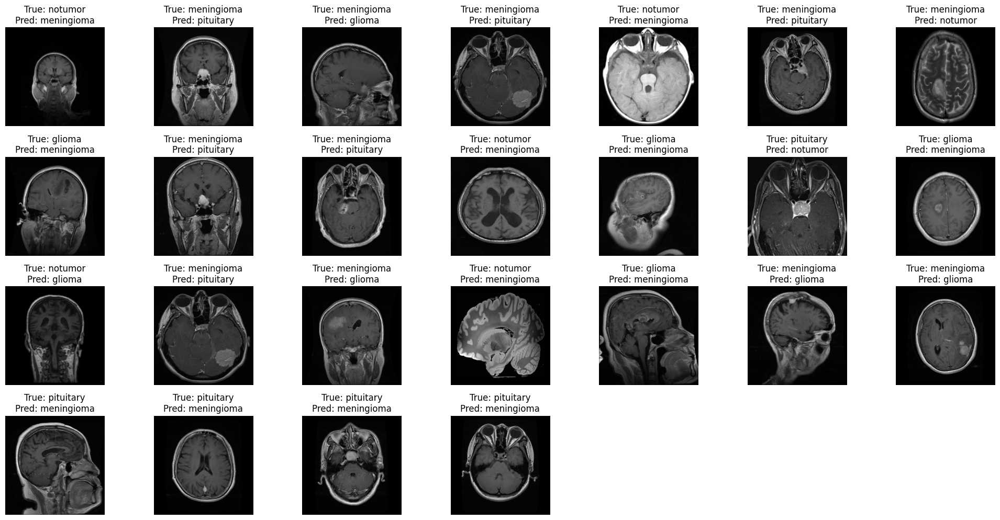

In [ ]:
misclassified_points(vgg16flat_pred)

### Saliency map

In [ ]:
display_silency_map([170, 464, 27, 2], vgg16flat)

### GradCAM


In [ ]:
display_gradcam([170, 464, 27, 2], vgg16flat, last_conv_layer_name)

NameError: name 'display_gradcam' is not defined

## Data Augmentation

### Augmented datagenerator

In [ ]:
train_datagen_aug = ImageDataGenerator(rescale=1./255,
                                        rotation_range= 10,
                                        brightness_range=(0.85, 1.15),
                                        width_shift_range=0.002,
                                        height_shift_range=0.002,
                                        shear_range=12.5,
                                        zoom_range=0,
                                        horizontal_flip=True,
                                        vertical_flip=False,
                                        fill_mode="nearest")

train_generator_aug = train_datagen_aug.flow(X_train,
                                          y_train_ohe,
                                          batch_size= BATCH_SIZE,
                                          seed= SEED)

### Visualizing the first batch

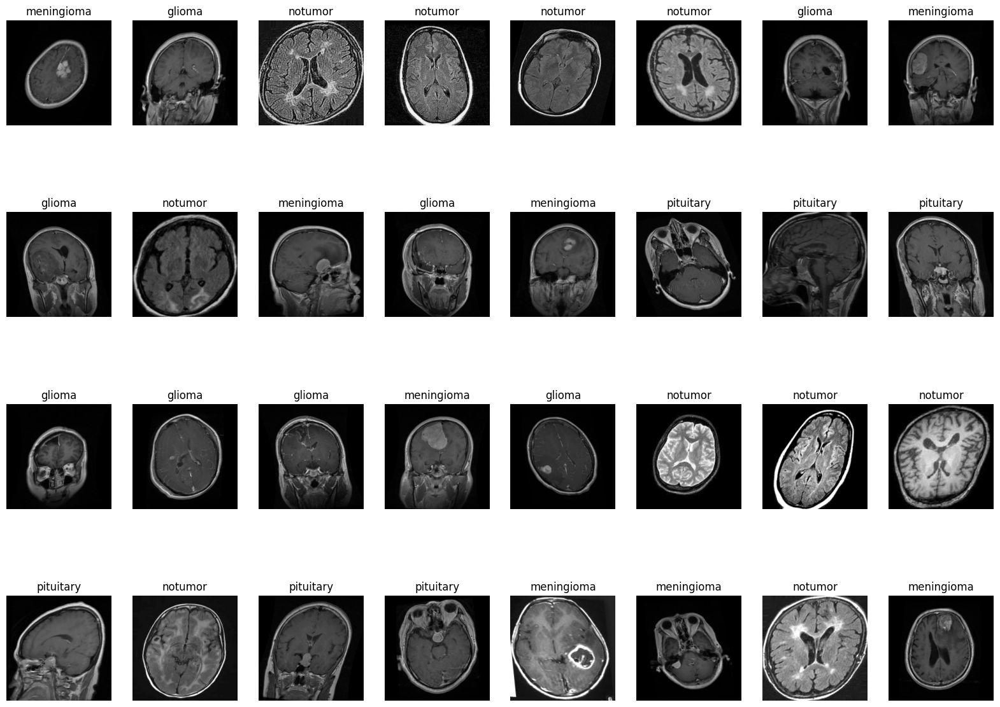

In [ ]:
labels = ['glioma', 'meningioma', 'notumor', 'pituitary']
images, label = next(train_generator_aug)
plt.figure(figsize=(20, 15))
for i in range(32):
    ax = plt.subplot(4, 8, i + 1)
    plt.imshow(images[i])
    plt.title(labels[np.argmax(label[i])])
    plt.axis("off")

### 3-layers-CNN

#### Building the model

In [ ]:
cnn_aug = Sequential(name = "CNN_AUG")

cnn_aug.add(Conv2D(32, (3, 3), activation='relu', input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)))
cnn_aug.add(MaxPooling2D((2, 2)))

cnn_aug.add(Conv2D(64, (3, 3), activation='relu'))
cnn_aug.add(MaxPooling2D((2, 2)))

cnn_aug.add(Conv2D(128, (3, 3), activation='relu', name = 'con_aug_last_conv_layer'))
cnn_aug.add(MaxPooling2D((2, 2)))

cnn_aug.add(Flatten())
cnn_aug.add(Dense(128, activation='relu'))
cnn_aug.add(Dense(4))
cnn_aug.add(Activation('softmax'))


cnn_aug.summary()

Model: "CNN_AUG"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 111, 111, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_3 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 con_aug_last_conv_layer (C  (None, 52, 52, 128)       73856     
 onv2D)                                                          
                                                           

#### Training

In [ ]:
cnn_aug_loss = tf.keras.losses.CategoricalCrossentropy()
cnn_aug_optimizer = RectifiedAdam(learning_rate=0.0001, beta_1 = 0.9, beta_2 = 0.999, epsilon = 1e-08)

In [ ]:
cnn_aug.compile(optimizer=cnn_aug_optimizer, loss=cnn_aug_loss, metrics=['accuracy'])

In [ ]:
cnn_aug_tensorboard = TensorBoard(log_dir = 'logs')
cnn_aug_checkpoint = ModelCheckpoint("CNN_AUG.h5",monitor="val_accuracy",save_best_only=True,mode="auto",verbose=1)
cnn_aug_earlystopping = EarlyStopping(monitor="val_accuracy",mode="auto",patience=5)
cnn_aug_reduce_lr = ReduceLROnPlateau(monitor = 'val_accuracy', factor = 0.3, patience = 2, min_delta = 0.001,
                              mode='auto',verbose=1)

In [ ]:
cnn_aug_history = cnn_aug.fit(train_generator_aug, validation_data = val_generator, epochs =20, verbose=1,
                   callbacks=[cnn_aug_tensorboard,cnn_aug_checkpoint,cnn_aug_reduce_lr, cnn_aug_earlystopping])

Epoch 1/20
169/169 [==============================] - ETA: 0s - loss: 1.0800 - accuracy: 0.5197
Epoch 1: val_accuracy improved from -inf to 0.66865, saving model to CNN_AUG.h5
169/169 [==============================] - 70s 411ms/step - loss: 1.0800 - accuracy: 0.5197 - val_loss: 0.8568 - val_accuracy: 0.6686 - lr: 1.0000e-04
Epoch 2/20
169/169 [==============================] - ETA: 0s - loss: 0.6937 - accuracy: 0.7310
Epoch 2: val_accuracy improved from 0.66865 to 0.77117, saving model to CNN_AUG.h5
169/169 [==============================] - 70s 415ms/step - loss: 0.6937 - accuracy: 0.7310 - val_loss: 0.6619 - val_accuracy: 0.7712 - lr: 1.0000e-04
Epoch 3/20
169/169 [==============================] - ETA: 0s - loss: 0.5654 - accuracy: 0.7805
Epoch 3: val_accuracy improved from 0.77117 to 0.80832, saving model to CNN_AUG.h5
169/169 [==============================] - 67s 396ms/step - loss: 0.5654 - accuracy: 0.7805 - val_loss: 0.5452 - val_accuracy: 0.8083 - lr: 1.0000e-04
Epoch 4/20
16

NameError: name 'cnn_aug_history' is not defined

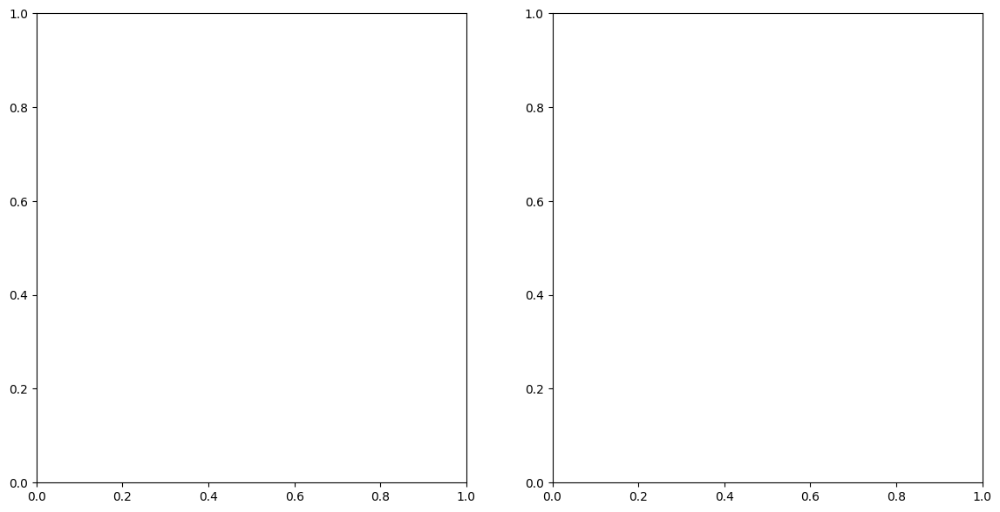

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(14,7))
train_acc = cnn_aug_history.history['accuracy']
train_loss = cnn_aug_history.history['loss']
val_acc = cnn_aug_history.history['val_accuracy']
val_loss = cnn_aug_history.history['val_loss']

epochs = [i for i in range(len(train_loss))]

ax[0].plot(epochs,train_acc,'go-',label='Training Accuracy')
ax[0].plot(epochs,val_acc,'ro-',label='Validation Accuracy')
ax[0].set_title('Training & Validation Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs,train_loss,'go-',label='Training Loss')
ax[1].plot(epochs,val_loss,'ro-',label='Validation Loss')
ax[1].set_title('Training & Validation Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")
plt.show()

#### Prediction


In [ ]:
cnn_aug_pred = cnn_aug.predict(test_generator, steps = len(test_generator))
cnn_aug_pred = np.argmax(cnn_aug_pred,axis=1)

#### Classification Report and confusion matrix

In [ ]:
print(classification_report(y_test_gen,cnn_aug_pred))

              precision    recall  f1-score   support

           0       0.85      0.86      0.85       162
           1       0.83      0.70      0.76       164
           2       0.91      0.95      0.93       173
           3       0.91      0.99      0.95       174

    accuracy                           0.88       673
   macro avg       0.88      0.88      0.87       673
weighted avg       0.88      0.88      0.88       673



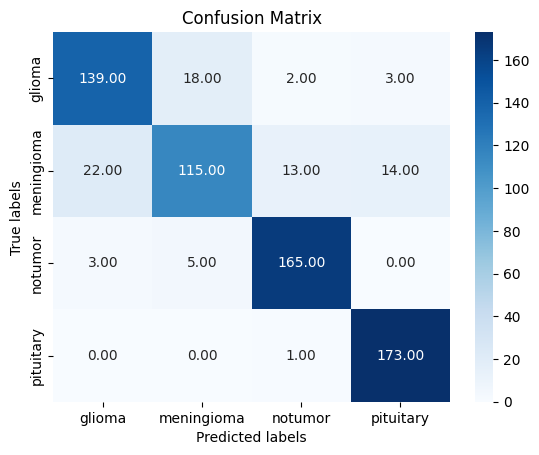

In [ ]:
labels = ['glioma', 'meningioma', 'notumor', 'pituitary']
cm = confusion_matrix(y_test_gen, cnn_aug_pred)
sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()


#### Misclassified points

Number of misclassified images: 136


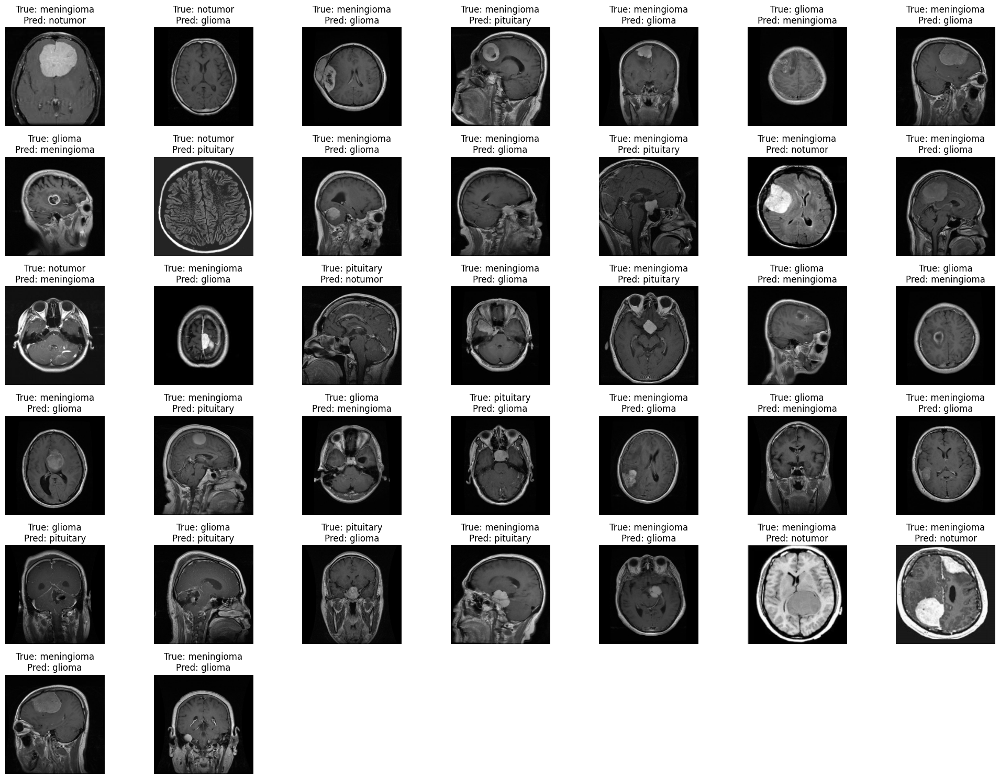

In [ ]:
misclassified_points(cnn_aug_pred)

#### Saliency_map

1/1 [==============================] - 0s 18ms/step


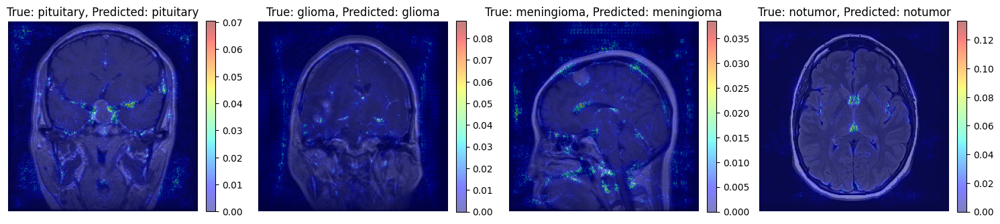

In [ ]:
display_silency_map([170, 464, 27, 2], cnn_aug)

#### GradCAM


1/1 [==============================] - 0s 18ms/step


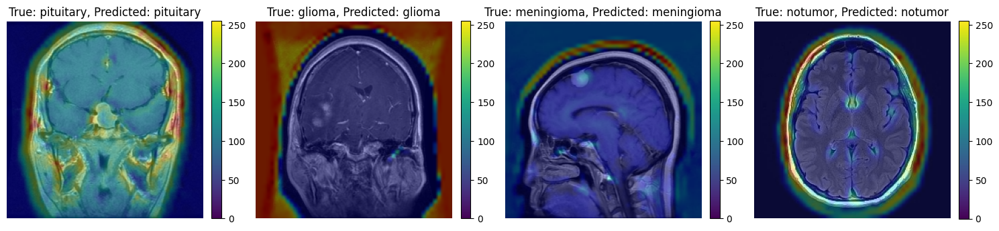

In [ ]:
display_gradcam([170, 464, 27, 2], cnn_aug, 'con_aug_last_conv_layer')

### Deeper costum CNN (optional)


#### Building the model

In [ ]:
deep_cnn = Sequential(name = 'DEEP_CNN')

deep_cnn.add(Conv2D(16, (3, 3), activation='relu', input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)))
deep_cnn.add(MaxPooling2D((2, 2)))

deep_cnn.add(Conv2D(32, (3, 3), activation='relu'))
deep_cnn.add(Conv2D(32, (3, 3), activation='relu'))

deep_cnn.add(MaxPooling2D((2, 2)))

deep_cnn.add(Conv2D(64, (3, 3), activation='relu'))
deep_cnn.add(Conv2D(64, (3, 3), activation='relu'))
deep_cnn.add(Conv2D(64, (3, 3), activation='relu'))

deep_cnn.add(MaxPooling2D((2, 2)))

deep_cnn.add(Conv2D(128, (3, 3), activation='relu'))

deep_cnn.add(Conv2D(128, (3, 3), activation='relu', name = 'deep_cnn_last_conv_layer'))

deep_cnn.add(Flatten())
deep_cnn.add(Dense(128, activation='relu'))
deep_cnn.add(Dense(4))
deep_cnn.add(Activation('softmax'))

#model summary
deep_cnn.summary()

#### Training

In [ ]:
deep_cnn_loss = tf.keras.losses.CategoricalCrossentropy()
deep_cnn_optimizer = RectifiedAdam(learning_rate=0.0001, beta_1 = 0.9, beta_2 = 0.999, epsilon = 1e-08)

In [ ]:
deep_cnn.compile(optimizer= deep_cnn_optimizer, loss= deep_cnn_loss, metrics=['accuracy'])

In [ ]:
deep_cnn_tensorboard = TensorBoard(log_dir = 'logs')
deep_cnn_checkpoint = ModelCheckpoint("deep_cnn.h5",monitor="val_accuracy",save_best_only=True,mode="auto",verbose=1)
deep_cnn_earlystopping = EarlyStopping(monitor="val_accuracy",mode="auto",patience=5)
deep_cnn_reduce_lr = ReduceLROnPlateau(monitor = 'val_accuracy', factor = 0.3, patience = 2, min_delta = 0.001,
                              mode='auto',verbose=1)

In [ ]:
deep_cnn_history = deep_cnn.fit(train_generator_aug, validation_data = val_generator, epochs =20, verbose=1,
                   callbacks=[deep_cnn_tensorboard,deep_cnn_checkpoint,deep_cnn_reduce_lr, deep_cnn_earlystopping],workers= 16)

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(14,7))
train_acc = deep_cnn_history.history['accuracy']
train_loss = deep_cnn_history.history['loss']
val_acc = deep_cnn_history.history['val_accuracy']
val_loss = deep_cnn_history.history['val_loss']

epochs = [i for i in range(len(train_loss))]

ax[0].plot(epochs,train_acc,'go-',label='Training Accuracy')
ax[0].plot(epochs,val_acc,'ro-',label='Validation Accuracy')
ax[0].set_title('Training & Validation Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs,train_loss,'go-',label='Training Loss')
ax[1].plot(epochs,val_loss,'ro-',label='Validation Loss')
ax[1].set_title('Training & Validation Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")
plt.show()

#### Prediction


In [ ]:
deep_cnn_pred = deep_cnn.predict(test_generator, steps = len(test_generator))
deep_cnn_pred = np.argmax(deep_cnn_pred,axis=1)

#### Classification Report and confusion matrix

In [ ]:
print(classification_report(y_test_gen,deep_cnn_pred))

In [ ]:
labels = ['glioma', 'meningioma', 'notumor', 'pituitary']
cm = confusion_matrix(y_test_gen, deep_cnn_pred)
sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()


#### Misclassified points

In [ ]:
misclassified_points(deep_cnn_pred)

#### Saliency map

In [ ]:
display_silency_map([7, 8, 0, 2], deep_cnn)

#### GradCAM


In [ ]:
display_gradcam([7, 8, 0, 2], deep_cnn, 'deep_cnn_last_conv_layer')

## VGG16

### Building the model

In [ ]:
vgg16_model = VGG16(weights='imagenet', include_top= False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
for layer in vgg16_model.layers:
 layer.trainable = False

vgg16_model.layers[-2].trainable = True
vgg16_model.layers[-3].trainable = True
vgg16_model.layers[-4].trainable = True

x = GlobalAveragePooling2D()(vgg16_model.output)
x = Dropout(0.05)(x)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.1))(x)
x = Dense(4)(x)
x = Activation('softmax')(x)

vgg16 = Model(inputs = vgg16_model.input, outputs = x, name = "VGG16")
vgg16.summary()

last_conv_layer_name = 'block5_conv3'

58889256/58889256 [==============================] - 3s 0us/step
Model: "VGG16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

### Training

In [ ]:
vgg16_loss = tf.keras.losses.CategoricalCrossentropy()
vgg16_optimizer = RectifiedAdam(learning_rate=0.0001, beta_1 = 0.9, beta_2 = 0.999, epsilon = 1e-08)

In [ ]:
vgg16.compile(optimizer=vgg16_optimizer, loss=vgg16_loss, metrics=['accuracy'])

In [ ]:
vgg16_tensorboard = TensorBoard(log_dir = 'logs')
vgg16_checkpoint = ModelCheckpoint("vgg16.h5",monitor="val_accuracy",save_best_only=True,mode="auto",verbose=1)
vgg16_earlystopping = EarlyStopping(monitor="val_accuracy",mode="auto",patience=5)
vgg16_reduce_lr = ReduceLROnPlateau(monitor = 'val_accuracy', factor = 0.3, patience = 2, min_delta = 0.001,
                              mode='auto',verbose=1)

In [ ]:
vgg_16_history = vgg16.fit(train_generator_aug, validation_data = val_generator, epochs =14, verbose=1, batch_size= BATCH_SIZE,
                   callbacks=[vgg16_tensorboard,vgg16_checkpoint,vgg16_reduce_lr, vgg16_earlystopping])

Epoch 1/14
169/169 [==============================] - ETA: 0s - loss: 20.5624 - accuracy: 0.6844
Epoch 1: val_accuracy improved from -inf to 0.85290, saving model to vgg16.h5
169/169 [==============================] - 70s 365ms/step - loss: 20.5624 - accuracy: 0.6844 - val_loss: 19.1603 - val_accuracy: 0.8529 - lr: 1.0000e-04
Epoch 2/14


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


169/169 [==============================] - ETA: 0s - loss: 17.7321 - accuracy: 0.8730
Epoch 2: val_accuracy improved from 0.85290 to 0.89004, saving model to vgg16.h5
169/169 [==============================] - 60s 357ms/step - loss: 17.7321 - accuracy: 0.8730 - val_loss: 16.2646 - val_accuracy: 0.8900 - lr: 1.0000e-04
Epoch 3/14
169/169 [==============================] - ETA: 0s - loss: 14.7324 - accuracy: 0.9035
Epoch 3: val_accuracy improved from 0.89004 to 0.89896, saving model to vgg16.h5
169/169 [==============================] - 60s 355ms/step - loss: 14.7324 - accuracy: 0.9035 - val_loss: 13.2490 - val_accuracy: 0.8990 - lr: 1.0000e-04
Epoch 4/14
169/169 [==============================] - ETA: 0s - loss: 11.7183 - accuracy: 0.9297
Epoch 4: val_accuracy did not improve from 0.89896
169/169 [==============================] - 61s 357ms/step - loss: 11.7183 - accuracy: 0.9297 - val_loss: 10.4100 - val_accuracy: 0.8945 - lr: 1.0000e-04
Epoch 5/14
169/169 [============================

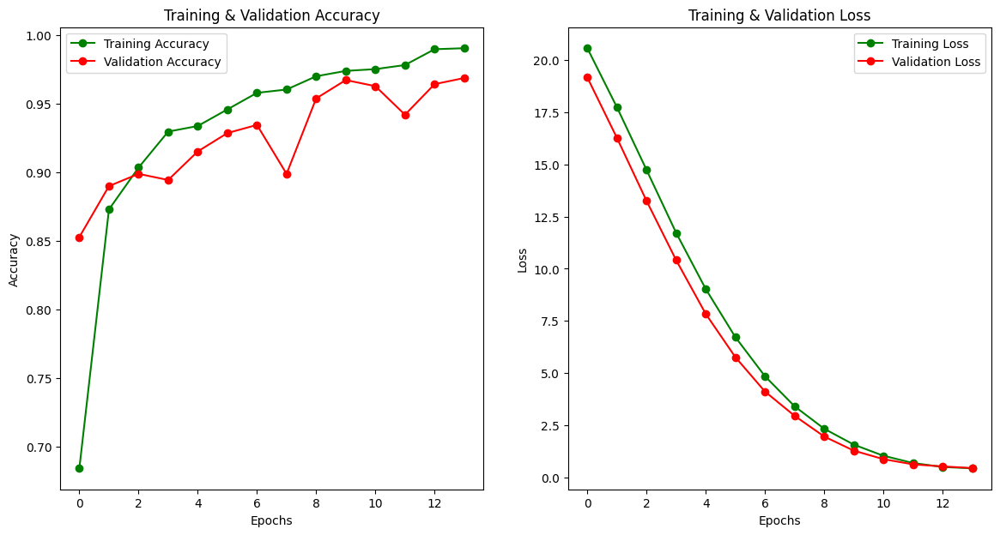

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(14,7))
train_acc = vgg_16_history.history['accuracy']
train_loss = vgg_16_history.history['loss']
val_acc = vgg_16_history.history['val_accuracy']
val_loss = vgg_16_history.history['val_loss']

epochs = [i for i in range(len(train_loss))]

ax[0].plot(epochs,train_acc,'go-',label='Training Accuracy')
ax[0].plot(epochs,val_acc,'ro-',label='Validation Accuracy')
ax[0].set_title('Training & Validation Accuracy')
ax[0].legend()
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs,train_loss,'go-',label='Training Loss')
ax[1].plot(epochs,val_loss,'ro-',label='Validation Loss')
ax[1].set_title('Training & Validation Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")
plt.show()

### Prediction

In [ ]:
vgg16_pred = vgg16.predict(test_generator, steps = len(test_generator))
vgg16_pred = np.argmax(vgg16_pred,axis=1)

22/22 [==============================] - 3s 123ms/step


### Classification Report and confusion matrix

In [ ]:
print(classification_report(y_test_gen,vgg16_pred))

              precision    recall  f1-score   support

           0       0.95      0.98      0.96       162
           1       0.96      0.93      0.94       164
           2       0.99      0.98      0.99       173
           3       0.98      0.99      0.99       174

    accuracy                           0.97       673
   macro avg       0.97      0.97      0.97       673
weighted avg       0.97      0.97      0.97       673



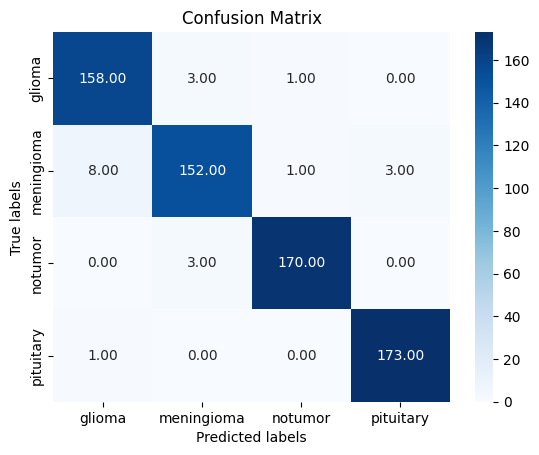

In [ ]:
labels = ['glioma', 'meningioma', 'notumor', 'pituitary']
cm = confusion_matrix(y_test_gen, vgg16_pred)
sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()


### Misclassified points

Number of misclassified images: 20


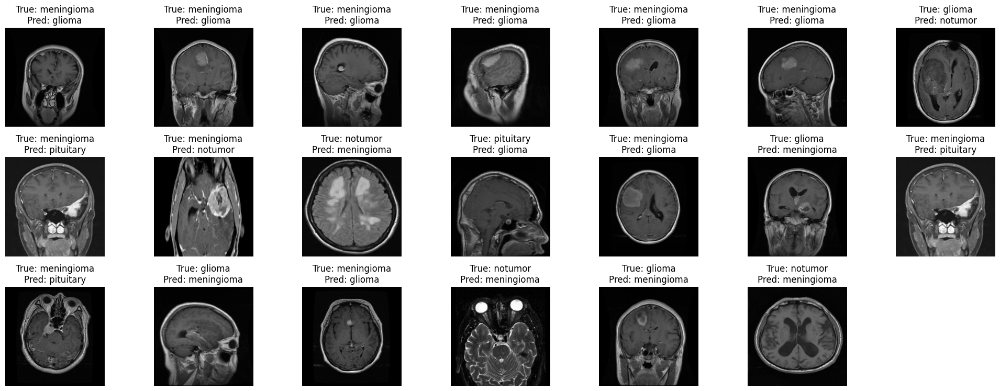

In [ ]:
misclassified_points(vgg16_pred)

### Saliency map

1/1 [==============================] - 0s 19ms/step


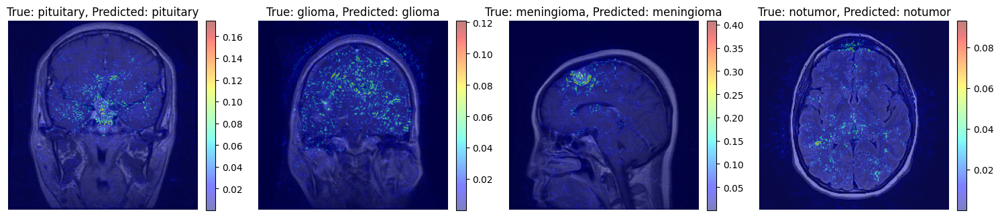

In [ ]:
display_silency_map([170, 464, 27, 2], vgg16)

### GradCAM


1/1 [==============================] - 0s 17ms/step


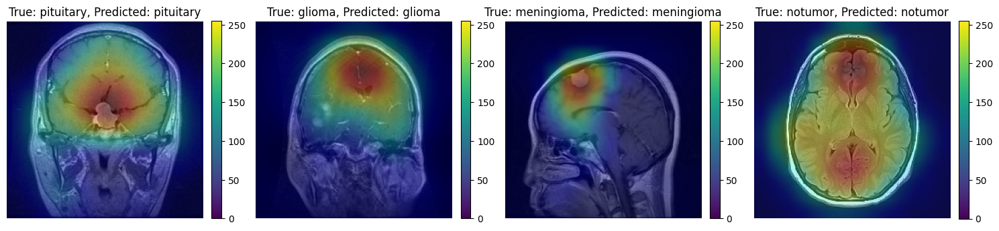

In [ ]:
display_gradcam([170, 464, 27, 2], vgg16, last_conv_layer_name)